In [1]:
# Imports

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# load in the results
result_dir = "/Users/katiepambakian/Documents/BSc Computer Science/Y3/Dissertation/BeeCommunication/results/"

# date = "2026-03-12/"
# slurm_job = 16290178 -> exibited the correct behaviour
date = "2026-03-13/"
slurm_job = 16323008
batches = [3, 7, 11, 12, 17, 18, 20, 21, 22, 23, 24, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 43, 46, 48, 49, 50, 53, 54, 56, 60, 63, 65, 68, 72, 73, 76, 77, 78, 79, 81, 84, 86, 87, 88, 91, 93, 95, 97, 99]


result_dir = result_dir + date + str(slurm_job) + "/"
# result_dir = "/Users/katiepambakian/Documents/BSc Computer Science/Y3/Dissertation/BeeCommunication/results/2026-03-11/batch_3/run_0"
# result_dir = result_dir + date + "v/"
# result_dir = result_dir + date + "/"

# start at line number 1
def read_ith_line(i, filename):
    with open(filename, "r") as file:
        for line_number, line in enumerate(file, start=1):
            if (line_number == i):
                return [float(x) for x in line.strip().split()]
            
    # If file exists but doesn't have that many lines
    return []

/var/folders/fz/htwq5qzj5_d0ry3b14hmlrsw0000gn/T/ipykernel_95406/1464902004.py:68: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/var/folders/fz/htwq5qzj5_d0ry3b14hmlrsw0000gn/T/ipykernel_95406/1464902004.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(16,10))


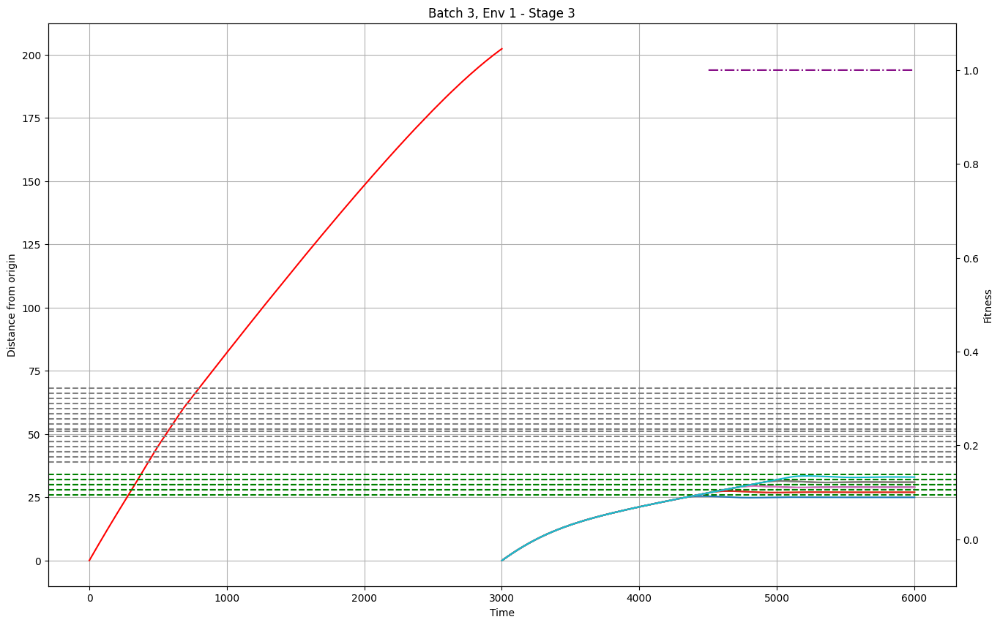

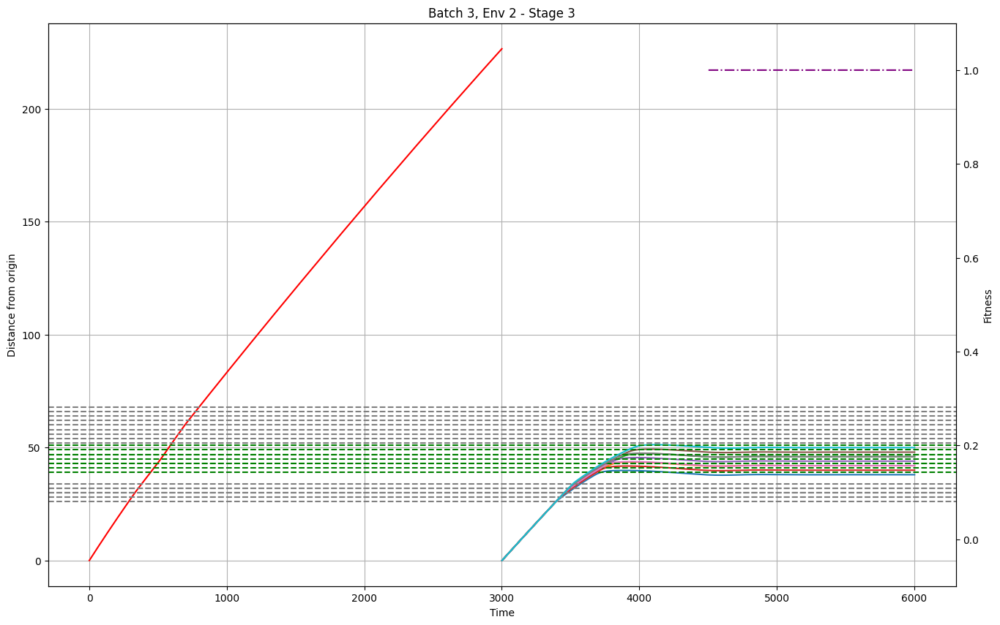

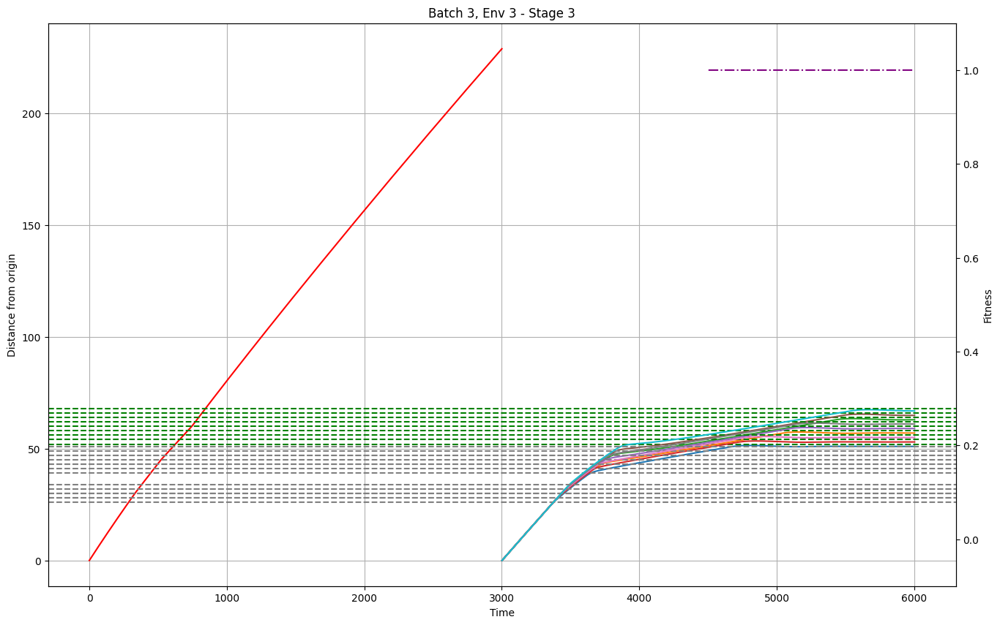

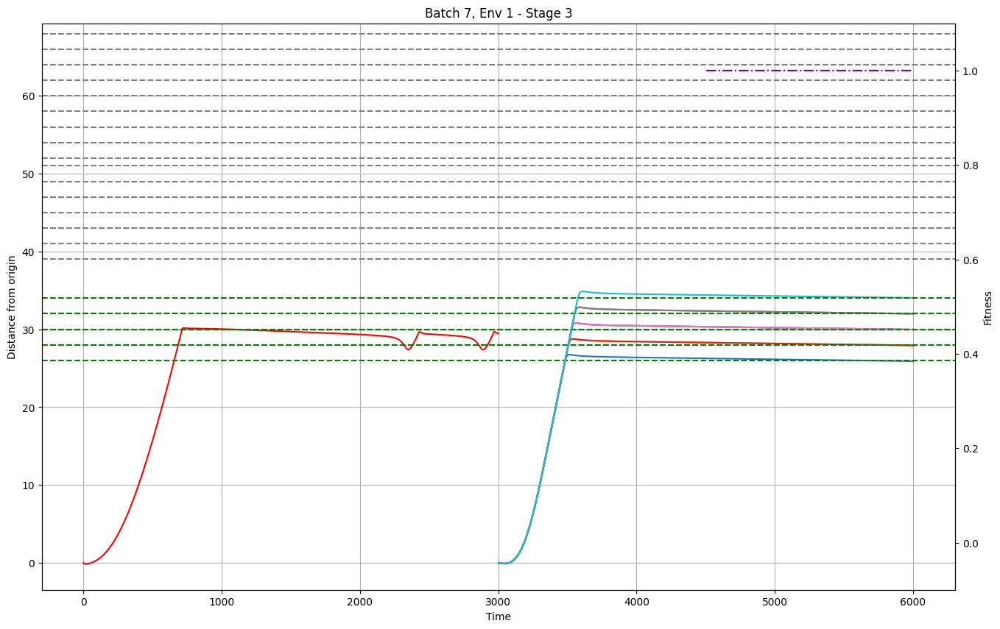

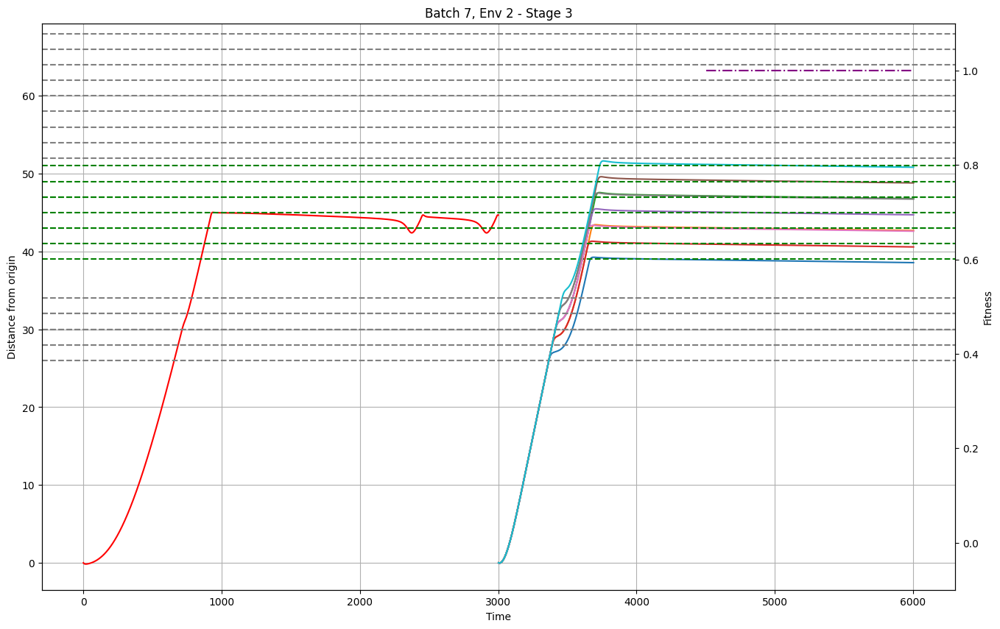

...

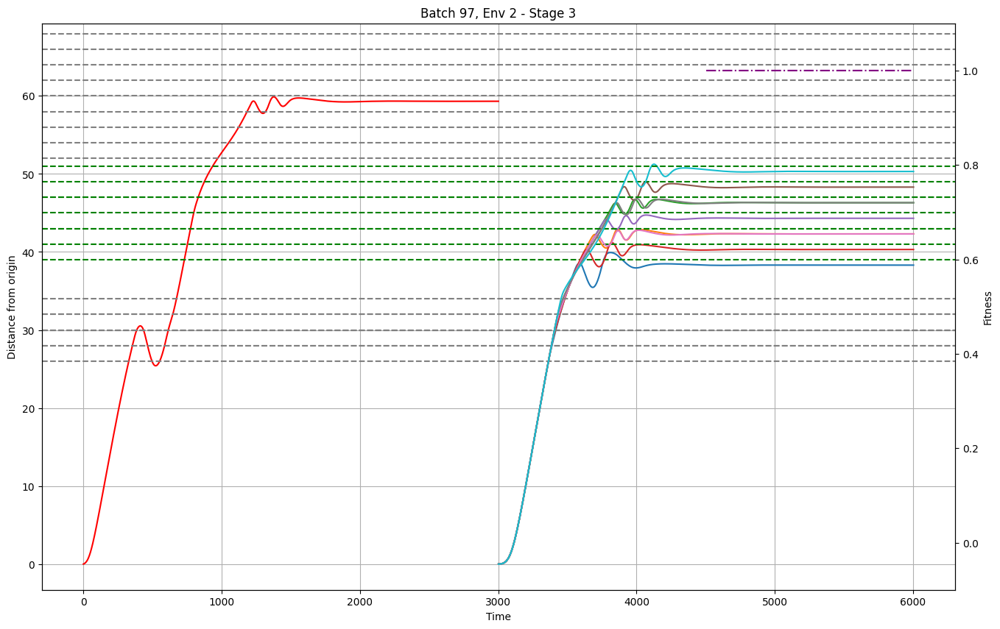

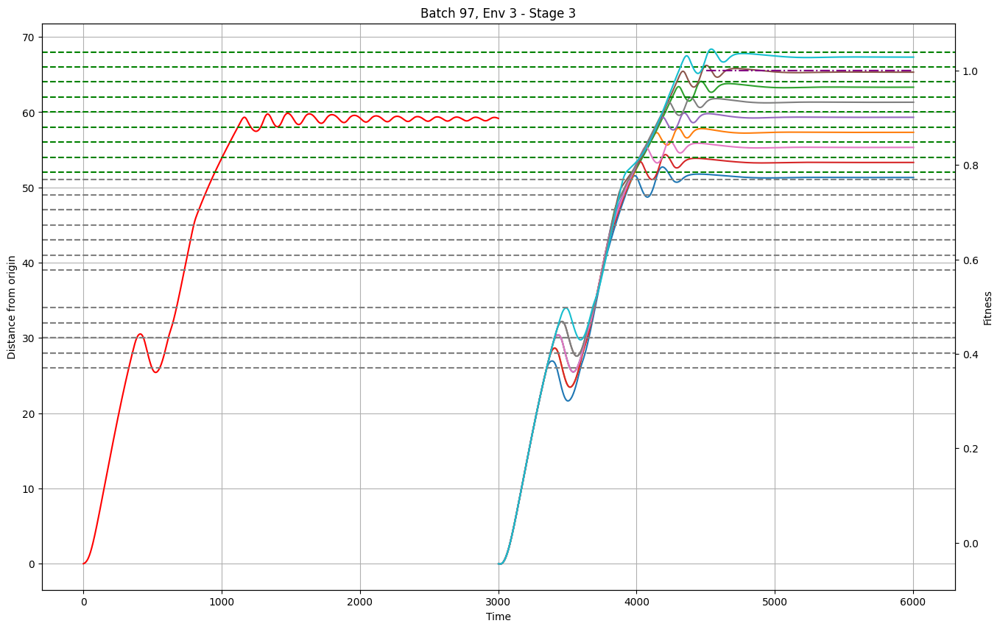

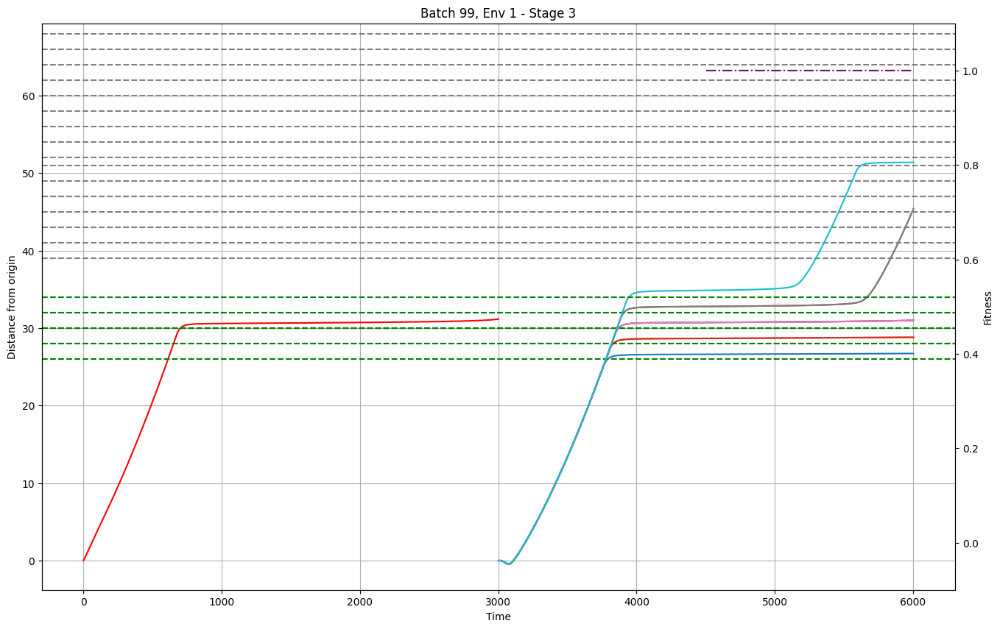

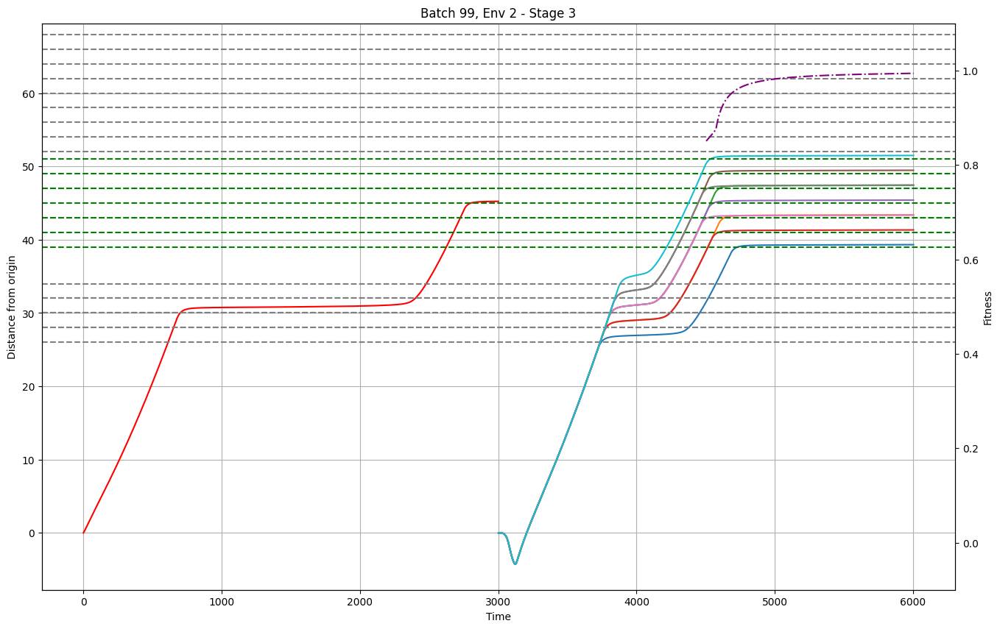

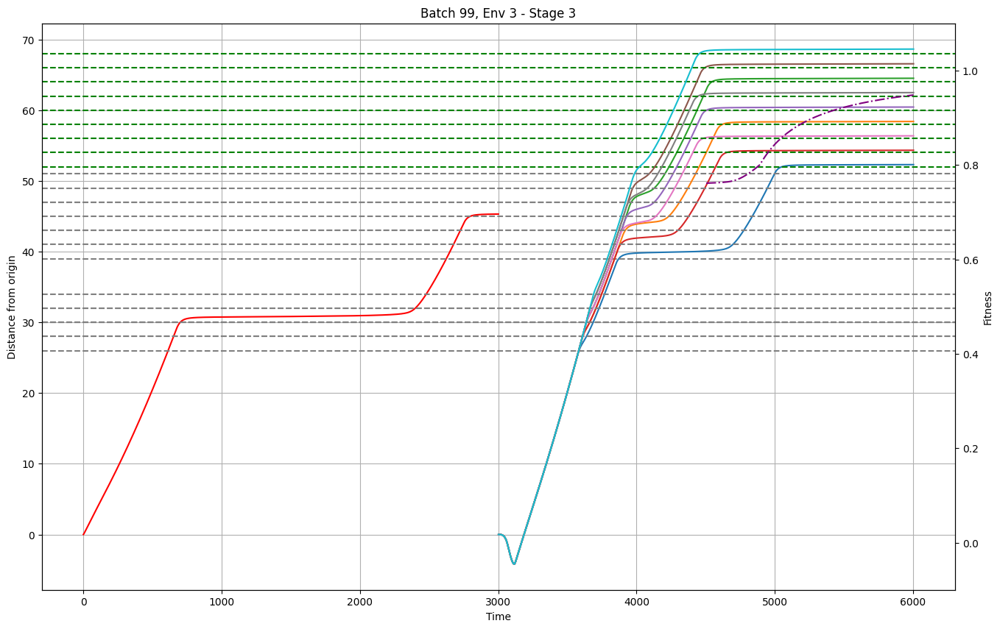

In [2]:
# training phase + pause behaviour
# this is looking at a single file
# phases = ["Phase1", "Phase2"]

delay = "delay"
envs = [1,2,3]
stage = "stage3"

run = 0

colors = [
    "#1F77B4",  # Blue
    "#FF7F0E",  # Orange
    "#2CA02C",  # Green
    "#D62728",  # Red
    "#9467BD",  # Purple
    "#8C564B",  # Brown
    "#E377C2",  # Pink
    "#7F7F7F",  # Grey
    "#17BECF"   # Teal
]

for batch_index, batch in enumerate(batches):
    for env in envs:
        fig, ax = plt.subplots(figsize=(16,10))
        ax2 = ax.twinx()
        # first plot phase 1 and phase 2 in the same plot
        phase1_dir = result_dir + f"batch_{batch}/run_{run}/behavior_{run}_Env{env}_{stage}_Phase1.dat"
        phase2_dir = result_dir + f"batch_{batch}/run_{run}/behavior_{run}_Env{env}_{stage}_Phase2.dat"
        landmark_file = result_dir+ f"batch_{batch}/run_{run}/landmark_location_{run}_env{env}_{stage}_phase2.dat"
    
        behavior1 = []
        behavior1.extend(read_ith_line(1, phase1_dir))
        offset = len(behavior1)
        x = list(range(0, len(behavior1)))
        ax.plot(x, behavior1, label=f"Agent - Phase1", color="red")

        
        for i in range(0, 9):
            behavior = []
            behavior.extend(read_ith_line(i+1, phase2_dir))
            x = list(range(offset, offset+len(behavior)))
            ax.plot(x, behavior, label=f"Agent", color=colors[i])

            landmark = read_ith_line(i+1, landmark_file)
            # print(landmark)
            landmarks = [0,1,2]
            for i in landmarks:
                if (i != env-1):
                    ax.axhline(y=landmark[i], linestyle="--", label=f"Landmark {i}", color="grey")
                else:
                    ax.axhline(y=landmark[i], linestyle="--", label="Food Position", color="green")

        # fitness
        fitness_file = result_dir+ f"batch_{batch}/run_{run}/fitness_{run}_env{env}_{stage}.dat"
        fitness = read_ith_line(1, fitness_file)
        fitness_start = ((len(behavior)+offset) - len(fitness))
        fitness_x = range(fitness_start, len(fitness)+fitness_start)

        ax2.plot(fitness_x, fitness, linestyle="dashdot", color="purple")
        ax2.set_ylim(bottom=-0.1, top=1.1)
        ax2.set_ylabel("Fitness")
        # plot it
        ax.set_xlabel("Time")
        ax.set_ylabel("Distance from origin")
        ax.set_title(f"Batch {batch}, Env {env} - Stage 3")
        ax.grid(True)
        fig.show()